- webpage containing category ids
- https://developer.foursquare.com/docs/resources/categories
- how to get category ids with request
- https://developer.foursquare.com/docs/api/venues/categories


#### Load the necessary libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

import matplotlib.pyplot as plt #plotting

from scipy.spatial.distance import cdist

from sklearn.metrics import silhouette_score

#import gap_statistic as gap_stat

print('Libraries imported.')

Libraries imported.


#### Define Foursquare Credentials and Version

In [63]:
CLIENT_ID = 'USE YOUR ID' #Foursquare ID
CLIENT_SECRET = 'USE YOUR SECRET' #Foursquare Secret

VERSION = '20200202' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)
radius = 500
LIMIT = 100

Your credentails:
CLIENT_ID: USE YOUR ID
CLIENT_SECRET:USE YOUR SECRET


### New York Data

#### Load and format New York data

In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)
    
neighborhoods_data = newyork_data['features']
    
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
newyork_neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    newyork_neighborhoods = newyork_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

newyork_neighborhoods.head(10)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


### Toronto Data

#### Load and format Toronto data

In [4]:
#assign the given link to a variable
link = "https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M"

#read_html to create dataframe from webpage tables
web_data = pd.read_html(link)

#create a new dataframe that contains only the required table
webdf = pd.DataFrame(web_data[0])

#drop all rows that don't have an assigned borough on the post code
webdf.drop(webdf[webdf['Borough'] == 'Not assigned' ].index , inplace=True)

#reset the index to avoid issues
webdf.reset_index(drop=True,inplace=True)

#view dataframe
webdf

#Save to csv for reference and later use
#ALREADY SAVED
#webdf.to_csv('Canada_PostalCodes.csv')

#create a new empty dataframe to use for joining the neighbourhoods as required
df = pd.DataFrame(columns=['Postcode','Borough','Neighbourhood'])

#loop through the intial dataframe to acquire groups and append to the new df
for a, b in webdf.groupby(['Postal code','Borough']): #20200501 'Postcode' became 'Postal Code'

                                                        #20200501:b['Neighbourhood'] became :b['Neighborhood']            
    df = df.append({'Postcode':a[0],'Borough':a[1],'Neighbourhood':b['Neighborhood'].values},ignore_index=True)

#after looping the contents of column Neighbourhood are lists so there is one more thing to be done
#to remove the brackets and join the list contents
df['Neighbourhood'] = df['Neighbourhood'].str.join(', ')

#If a cell has a borough but a Not assigned neighbourhood, then the neighbourhood will be the same as the borough.
df['Neighbourhood'][df['Neighbourhood'] == 'Not assigned'] = df['Borough']

#view dataframe for the first question
df.shape

geodata_df = pd.read_csv('Geospatial_Coordinates.csv')

geodata_df.rename(columns={'Postal Code': 'Postcode'}, inplace = True)

toronto_neighborhoods = df.merge(geodata_df)

toronto_neighborhoods.rename(columns={'Neighbourhood': 'Neighborhood'}, inplace = True)

#########df.join(geodata_df.set_index('Postcode'), on='Postcode')
toronto_neighborhoods.head(10)

,Postcode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,Malvern / Rouge,43.806686,-79.194353
1,M1C,Scarborough,Rouge Hill / Port Union / Highland Creek,43.784535,-79.160497
2,M1E,Scarborough,Guildwood / Morningside / West Hill,43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476
5,M1J,Scarborough,Scarborough Village,43.744734,-79.239476
6,M1K,Scarborough,Kennedy Park / Ionview / East Birchmount Park,43.727929,-79.262029
7,M1L,Scarborough,Golden Mile / Clairlea / Oakridge,43.711112,-79.284577
8,M1M,Scarborough,Cliffside / Cliffcrest / Scarborough Village West,43.716316,-79.239476
9,M1N,Scarborough,Birch Cliff / Cliffside West,43.692657,-79.264848


#### Define functions for later use

Function to return from Foursquare the requested information about venues

In [5]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Function to sort the venues in descending order.

In [6]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Function to retrieve recursively the categories with their ids from the dictionary

In [7]:
def get_categories(data):
    result = {}
    for cat in data:
        #if cat['id'] == '50aaa5234b90af0d42d5de12':
            #print(cat['id'])
        result[cat['id']] = cat['name']
        if cat['categories']:
            result.update(get_categories(cat['categories']))
    return result

### Load Foursquare data for New York and Toronto regarding venues

In [8]:
#TEMPORARY DISABLE TO AVOID REACHING THE LIMITS
#newyork_venues = getNearbyVenues(names=newyork_neighborhoods['Neighborhood'],
#                                   latitudes=newyork_neighborhoods['Latitude'],
#                                   longitudes=newyork_neighborhoods['Longitude']
#                                  )

In [9]:
#TEMPORARY DISABLE TO AVOID REACHING THE LIMITS
#toronto_venues = getNearbyVenues(names=toronto_neighborhoods['Neighborhood'],
#                                   latitudes=toronto_neighborhoods['Latitude'],
#                                   longitudes=toronto_neighborhoods['Longitude']
#                                  )

In [10]:
#SAVED ALREADY
#newyork_venues.to_csv('newyork_venues04.csv')
#toronto_venues.to_csv('toronto_venues04.csv')

In [11]:
newyork_venues = pd.read_csv('newyork_venues04.csv') 
newyork_venues = newyork_venues.drop('Unnamed: 0', 1)

toronto_venues = pd.read_csv('toronto_venues04.csv') 
toronto_venues = toronto_venues.drop('Unnamed: 0', 1)

In [12]:
newyork_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


In [13]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Malvern / Rouge,43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant
1,Rouge Hill / Port Union / Highland Creek,43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar
2,Guildwood / Morningside / West Hill,43.763573,-79.188711,RBC Royal Bank,43.766790,-79.191151,Bank
3,Guildwood / Morningside / West Hill,43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store
4,Guildwood / Morningside / West Hill,43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant


### Load and format Foursquare data regarding venue categories

In [14]:
cats_url = 'https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET,
            VERSION)

#view the url
#cats_url

cats_results = requests.get(cats_url).json()

#restaurant categories extracted
restcats_dict = get_categories(cats_results['response']['categories'][3]['categories'])
restcats = pd.DataFrame.from_dict(restcats_dict.items())

In [15]:
restcats.head()

,0,1
0,503288ae91d4c4b30a586d67,Afghan Restaurant
1,4bf58dd8d48988d1c8941735,African Restaurant
2,4bf58dd8d48988d10a941735,Ethiopian Restaurant
3,4bf58dd8d48988d14e941735,American Restaurant
4,4bf58dd8d48988d157941735,New American Restaurant


In [16]:
#We can examine the categorization with the following lines of code

cats_normalized = json_normalize(cats_results['response']['categories'][3]['categories'][1]['categories']) # flatten JSON
cats_normalized

,id,name,pluralName,shortName,categories,icon.prefix,icon.suffix
0,4bf58dd8d48988d10a941735,Ethiopian Restaurant,Ethiopian Restaurants,Ethiopian,[],https://ss3.4sqi.net/img/categories_v2/food/et...,.png


### Create dataframes for restaurants and other categories separated

In [17]:
############################################################################################
# ANOTHER WAY TO SEPARATE RESTAURANTS FROM OTHER VENUE CATEGORIES
############################################################################################

#allcats_dict = get_categories(cats_results['response']['categories'])
#allcats = pd.DataFrame.from_dict(allcats_dict.items())

#othercats = allcats[np.logical_not(allcats[0].isin(restcats[0]))]

#newyork_other = newyork_venues[newyork_venues['Venue Category'].isin(othercats[1])]
#toronto_other = toronto_venues[toronto_venues['Venue Category'].isin(othercats[1])]

############################################################################################
############################################################################################

newyork_restaurants = newyork_venues[newyork_venues['Venue Category'].isin(restcats[1])]
toronto_restaurants = toronto_venues[toronto_venues['Venue Category'].isin(restcats[1])]

newyork_other = newyork_venues[np.logical_not(newyork_venues['Venue Category'].isin(restcats[1]))]
toronto_other = toronto_venues[np.logical_not(toronto_venues['Venue Category'].isin(restcats[1]))]

#newyork_venues = newyork_restaurants
#toronto_venues = toronto_restaurants
#newyork_venues = newyork_other
#toronto_venues = toronto_other

#### Check that all venues were included either in restaurants or in other categories

In [18]:
print('NY ALL:',newyork_venues.shape[0])
print('NY RES:',newyork_restaurants.shape[0])
print('NY OTH:',newyork_other.shape[0])

print('TO ALL:',toronto_venues.shape[0])
print('TO RES:',toronto_restaurants.shape[0])
print('TO OTH:',toronto_other.shape[0])

NY ALL: 9751
NY RES: 5078
NY OTH: 4673
TO ALL: 2110
TO RES: 1161
TO OTH: 949


### Some analysis regarding the maltitude of restaurants by category

In [19]:
x = 10

ny_grp_counts = newyork_restaurants.groupby('Venue Category').count().sort_values('Venue',ascending=False)[['Venue']]
to_grp_counts = toronto_restaurants.groupby('Venue Category').count().sort_values('Venue',ascending=False)[['Venue']]

print('TOP', x ,'restaurant categories in New York\n\n', ny_grp_counts.head(x))
print('Count of TOP', x,'    ', ny_grp_counts['Venue'].head(x).sum())
print('{:.2%}'.format(ny_grp_counts['Venue'].head(x).sum()/newyork_restaurants.shape[0]), 'of total')

print('\nTOP', x ,'restaurant categories in Toronto\n\n',to_grp_counts.head(x))
print('Count of TOP', x,'      ', to_grp_counts['Venue'].head(x).sum())
print('{:.2%}'.format(to_grp_counts['Venue'].head(x).sum()/toronto_restaurants.shape[0]), 'of total')

#x = 30
#ny_grp_counts.head(x).join(to_grp_counts.head(x), 
#                           lsuffix='Venue Category',# rsuffix='Venue Category', 
#                           on='Venue Category', how='inner').head()

#to_grp_counts.head(x).join(ny_grp_counts.head(x), 
#                           lsuffix='Venue Category',# rsuffix='Venue Category', 
#                           on='Venue Category', how='inner').head()

TOP 10 restaurant categories in New York

                     Venue
Venue Category           
Pizza Place           434
Italian Restaurant    297
Coffee Shop           289
Deli / Bodega         250
Bakery                214
Chinese Restaurant    213
Sandwich Place        187
Mexican Restaurant    172
Donut Shop            163
Café                  159
Count of TOP 10      2378
46.83% of total

TOP 10 restaurant categories in Toronto

                      Venue
Venue Category            
Coffee Shop            186
Café                    98
Restaurant              68
Pizza Place             46
Italian Restaurant      46
Japanese Restaurant     42
Bakery                  40
Sandwich Place          39
Sushi Restaurant        29
American Restaurant     28
Count of TOP 10        622
53.57% of total


### Some analysis regarding the maltitude of other venues by category

In [20]:
x = 10

ny_grp_counts = newyork_other.groupby('Venue Category').count().sort_values('Venue',ascending=False)[['Venue']]
to_grp_counts = toronto_other.groupby('Venue Category').count().sort_values('Venue',ascending=False)[['Venue']]

print('TOP', x ,'other categories in New York\n\n', ny_grp_counts.head(x))
print('Count of TOP', x,'      ', ny_grp_counts['Venue'].head(x).sum())
print('{:.2%}'.format(ny_grp_counts['Venue'].head(x).sum()/newyork_other.shape[0]), 'of total')

print('\nTOP', x ,'other categories in Toronto\n\n',to_grp_counts.head(x))
print('Count of TOP', x,' ', to_grp_counts['Venue'].head(x).sum())
print('{:.2%}'.format(to_grp_counts['Venue'].head(x).sum()/toronto_other.shape[0]), 'of total')

TOP 10 other categories in New York

                       Venue
Venue Category             
Bar                     202
Grocery Store           194
Park                    186
Pharmacy                167
Bank                    150
Gym / Fitness Center    129
Gym                     109
Supermarket             106
Hotel                   101
Spa                      95
Count of TOP 10        1439
30.79% of total

TOP 10 other categories in Toronto

                 Venue
Venue Category       
Park               54
Hotel              43
Gym                35
Clothing Store     33
Bar                32
Grocery Store      27
Bank               26
Pub                25
Pharmacy           20
Cosmetics Shop     19
Count of TOP 10   314
33.09% of total


In [21]:
ny_to_to = ny_grp_counts.join(to_grp_counts, 
                           lsuffix='Venue Category',# rsuffix='Venue Category', 
                           on='Venue Category', how='inner')

ny_to_to = ny_to_to.rename(columns={"VenueVenue Category": "NY", "Venue": "TO"})

ny_to_to['TOTAL'] = ny_to_to['NY'] + ny_to_to['TO']

ny_to_to.sort_values('TOTAL', ascending=False).head(10)

,NY,TO,TOTAL
Venue Category,,,
Park,186,54,240
Bar,202,32,234
Grocery Store,194,27,221
Pharmacy,167,20,187
Bank,150,26,176
Gym / Fitness Center,129,15,144
Gym,109,35,144
Hotel,101,43,144
Supermarket,106,8,114


In [22]:
restaurants_list = ['Italian Restaurant','Pizza Place']#, 'Chinese Restaurant',
                    #'American Restaurant','Mexican Restaurant', 'Japanese Restaurant','French Restaurant']


ny_rest_filter = newyork_venues[newyork_venues['Venue Category'].isin(restaurants_list)][['Neighborhood']].groupby('Neighborhood').count()#.shape

newyork_venues[newyork_venues['Venue Category'].isin(restaurants_list)][['Neighborhood']].groupby('Neighborhood').count().shape

(226, 0)

In [23]:
toronto_venues[toronto_venues['Venue Category'].isin(restaurants_list)]

to_rest_filter = toronto_venues[toronto_venues['Venue Category'].isin(restaurants_list)][['Neighborhood']].groupby('Neighborhood').count()#.shape

toronto_venues[toronto_venues['Venue Category'].isin(restaurants_list)][['Neighborhood']].groupby('Neighborhood').count().shape

(45, 0)

## Prepare for clustering

In [24]:
# one hot encoding
newyork_onehot = pd.get_dummies(newyork_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
newyork_onehot['Neighborhood'] = newyork_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic G

In [25]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Yoga Studio,Accessories Store,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hookah Bar,Hospital,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [26]:
newyork_grouped = newyork_onehot.groupby('Neighborhood').mean().reset_index()
newyork_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic G

In [27]:
newyork_grouped_clustering = newyork_grouped.drop('Neighborhood', 1)

In [28]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped

,Neighborhood,Yoga Studio,Accessories Store,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hookah Bar,Hospital,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wings Joint,Women's Store
0,Agincourt,0.000000,0.000000,0.000000,0.0000,0.0000,0.000,0.0000,0.000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,

In [29]:
toronto_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)

### Determine number of cluster based on Elbow and Avg Silhouette

#### New York Elbow

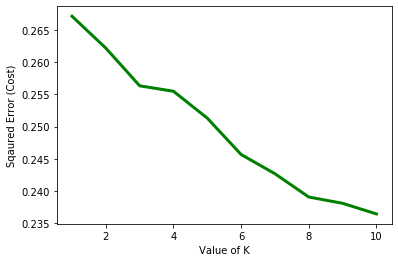

In [30]:
cost = []
distortions = []
for i in range(1, 11): 
    KM = KMeans(n_clusters = i, random_state=0, n_init=15, max_iter = 1000) 
    KM.fit(newyork_grouped_clustering) 
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)
    
    
    distortions.append(sum(np.min(cdist(newyork_grouped_clustering, KM.cluster_centers_, 
                      'euclidean'),axis=1)) / newyork_grouped_clustering.shape[0]) 
  
#plot the cost against K values 
#plt.plot(range(1, 11), cost, color ='r', linewidth ='3') 
plt.plot(range(1, 11), distortions, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show() # clear the plot 
  
# the point of the elbow is the  
# most optimal value for choosing k 

#### New York Avg Silhouette

In [31]:
range_n_clusters = list (range(2,11))

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=0, n_init=15, max_iter = 1000)
    preds = clusterer.fit_predict(newyork_grouped_clustering)
    centers = clusterer.cluster_centers_

    score = silhouette_score(newyork_grouped_clustering, preds)
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.5236801422751508)
For n_clusters = 3, silhouette score is 0.09529805887971099)
For n_clusters = 4, silhouette score is 0.5265485356597408)
For n_clusters = 5, silhouette score is 0.030516352395696653)
For n_clusters = 6, silhouette score is 0.033134899470598195)
For n_clusters = 7, silhouette score is 0.033259823939917985)
For n_clusters = 8, silhouette score is 0.03500437773899958)
For n_clusters = 9, silhouette score is 0.03699078931763086)
For n_clusters = 10, silhouette score is 0.03175896567437805)


#### Toronto Elbow

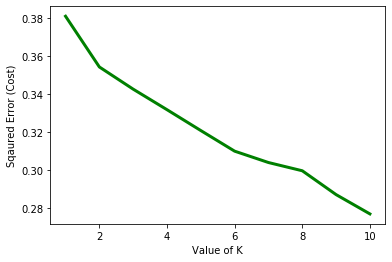

In [32]:
cost = []
distortions = []
for i in range(1, 11): 
    KM = KMeans(n_clusters = i, random_state=0, n_init=15, max_iter = 1000) 
    KM.fit(toronto_grouped_clustering) 
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)
    
    
    distortions.append(sum(np.min(cdist(toronto_grouped_clustering, KM.cluster_centers_, 
                      'euclidean'),axis=1)) / toronto_grouped_clustering.shape[0]) 
  
# plot the cost against K values 
#plt.plot(range(1, 11), cost, color ='r', linewidth ='3') 
plt.plot(range(1, 11), distortions, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show() # clear the plot 
  
# the point of the elbow is the  
# most optimal value for choosing k 

#### Toronto Silhouette

In [33]:
range_n_clusters = list (range(2,11))

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=0, n_init=15, max_iter = 1000)
    preds = clusterer.fit_predict(toronto_grouped_clustering)
    centers = clusterer.cluster_centers_

    score = silhouette_score(toronto_grouped_clustering, preds)
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.3018523882819826)
For n_clusters = 3, silhouette score is 0.2916324955210721)
For n_clusters = 4, silhouette score is 0.3003125718298839)
For n_clusters = 5, silhouette score is 0.30596654368247284)
For n_clusters = 6, silhouette score is 0.315103384915657)
For n_clusters = 7, silhouette score is 0.15138692180971608)
For n_clusters = 8, silhouette score is 0.10512880922234978)
For n_clusters = 9, silhouette score is 0.14205795339101646)
For n_clusters = 10, silhouette score is 0.11994526058467776)


In [34]:
num_top_venues = 5

for hood in newyork_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = newyork_grouped[newyork_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
                  venue  freq
0           Pizza Place  0.17
1      Department Store  0.07
2         Deli / Bodega  0.07
3           Supermarket  0.07
4  Fast Food Restaurant  0.03


----Annadale----
                 venue  freq
0           Bagel Shop  0.12
1                 Food  0.12
2        Train Station  0.12
3           Sports Bar  0.12
4  American Restaurant  0.12


----Arden Heights----
           venue  freq
0       Pharmacy   0.2
1  Deli / Bodega   0.2
2       Bus Stop   0.2
3    Pizza Place   0.2
4    Coffee Shop   0.2


----Arlington----
                 venue  freq
0             Bus Stop  0.33
1         Intersection  0.17
2  American Restaurant  0.17
3        Deli / Bodega  0.17
4         Home Service  0.17


----Arrochar----
                venue  freq
0            Bus Stop  0.19
1  Italian Restaurant  0.10
2       Deli / Bodega  0.10
3  Athletics & Sports  0.05
4          Food Truck  0.05


----Arverne----
             venue  freq
0        Surf Spot  0.24

4                       Pool   0.1


----Clifton----
                venue  freq
0  Mexican Restaurant  0.12
1       Grocery Store  0.12
2       Train Station  0.12
3      Discount Store  0.06
4         Pizza Place  0.06


----Clinton----
                  venue  freq
0               Theater  0.08
1           Coffee Shop  0.05
2  Gym / Fitness Center  0.05
3             Wine Shop  0.04
4                   Gym  0.04


----Clinton Hill----
                venue  freq
0  Italian Restaurant  0.05
1         Pizza Place  0.05
2           Wine Shop  0.04
3     Thai Restaurant  0.04
4  Mexican Restaurant  0.04


----Co-op City----
                  venue  freq
0           Bus Station  0.12
1        Baseball Field  0.06
2        Ice Cream Shop  0.06
3         Grocery Store  0.06
4  Fast Food Restaurant  0.06


----Cobble Hill----
         venue  freq
0          Bar  0.04
1   Playground  0.04
2  Pizza Place  0.04
3  Coffee Shop  0.04
4  Yoga Studio  0.03


----College Point----
                 

                 venue  freq
0                 Park  0.13
1       Scenic Lookout  0.06
2  American Restaurant  0.06
3          Coffee Shop  0.06
4          Pizza Place  0.04


----Georgetown----
                venue  freq
0                Bank  0.10
1            Pharmacy  0.07
2      Breakfast Spot  0.07
3          Donut Shop  0.07
4  Italian Restaurant  0.03


----Gerritsen Beach----
               venue  freq
0                Bar  0.12
1  Convenience Store  0.06
2  Martial Arts Dojo  0.06
3         Bagel Shop  0.06
4               Café  0.06


----Glen Oaks----
                       venue  freq
0                   Pharmacy  0.14
1          Mobile Phone Shop  0.09
2             Clothing Store  0.05
3                  Gift Shop  0.05
4  Middle Eastern Restaurant  0.05


----Glendale----
                 venue  freq
0  Arts & Crafts Store   0.2
1    Food & Drink Shop   0.2
2          Pizza Place   0.2
3   Chinese Restaurant   0.2
4              Brewery   0.2


----Gowanus----
        

                           venue  freq
0                   Tennis Court   0.2
1                      Rest Area   0.2
2                 Scenic Lookout   0.2
3                      Rock Club   0.2
4  Vegetarian / Vegan Restaurant   0.2


----Manhattan Beach----
            venue  freq
0        Bus Stop  0.18
1            Café  0.18
2      Playground  0.09
3  Ice Cream Shop  0.09
4  Sandwich Place  0.09


----Manhattan Terrace----
            venue  freq
0     Pizza Place  0.15
1      Donut Shop  0.12
2  Ice Cream Shop  0.08
3     Bus Station  0.04
4            Bank  0.04


----Manhattan Valley----
                venue  freq
0         Yoga Studio  0.05
1     Thai Restaurant  0.05
2  Chinese Restaurant  0.05
3         Coffee Shop  0.05
4         Pizza Place  0.05


----Manhattanville----
                venue  freq
0         Coffee Shop  0.09
1  Seafood Restaurant  0.07
2  Italian Restaurant  0.05
3                Park  0.05
4    Sushi Restaurant  0.05


----Manor Heights----
            

                venue  freq
0         Pizza Place  0.29
1  Italian Restaurant  0.14
2           Pet Store  0.14
3          Bagel Shop  0.14
4    Sushi Restaurant  0.14


----Prospect Heights----
                venue  freq
0                 Bar  0.08
1  Mexican Restaurant  0.07
2              Bakery  0.05
3        Cocktail Bar  0.05
4        Gourmet Shop  0.03


----Prospect Lefferts Gardens----
                  venue  freq
0                  Café  0.08
1           Pizza Place  0.08
2                Bakery  0.08
3         Deli / Bodega  0.06
4  Caribbean Restaurant  0.06


----Prospect Park South----
                  venue  freq
0  Caribbean Restaurant  0.09
1         Grocery Store  0.07
2  Fast Food Restaurant  0.07
3           Pizza Place  0.07
4     Mobile Phone Shop  0.07


----Queens Village----
                 venue  freq
0                 Bank  0.12
1             Bus Stop  0.12
2  Fried Chicken Joint  0.06
3           Donut Shop  0.06
4   Mexican Restaurant  0.06


----Queens

                 venue  freq
0   Italian Restaurant  0.07
1                 Park  0.07
2                 Café  0.04
3             Wine Bar  0.04
4  American Restaurant  0.04


----Tudor City----
                venue  freq
0                Park  0.07
1                Café  0.07
2  Mexican Restaurant  0.05
3         Pizza Place  0.04
4       Deli / Bodega  0.04


----Turtle Bay----
                venue  freq
0  Italian Restaurant  0.05
1         Coffee Shop  0.05
2            Wine Bar  0.04
3                Park  0.04
4       Deli / Bodega  0.04


----Unionport----
                       venue  freq
0                 Donut Shop  0.10
1             Ice Cream Shop  0.10
2  Latin American Restaurant  0.10
3         Seafood Restaurant  0.05
4       Caribbean Restaurant  0.05


----University Heights----
                       venue  freq
0                Pizza Place  0.15
1                Bus Station  0.05
2  Latin American Restaurant  0.05
3             Sandwich Place  0.05
4             

In [35]:
num_top_venues = 5

for hood in toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = toronto_grouped[toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                       venue  freq
0  Latin American Restaurant  0.25
1               Skating Rink  0.25
2                     Lounge  0.25
3             Breakfast Spot  0.25
4         Miscellaneous Shop  0.00


----Alderwood / Long Branch----
            venue  freq
0     Pizza Place  0.25
1    Skating Rink  0.12
2  Sandwich Place  0.12
3             Gym  0.12
4             Pub  0.12


----Bathurst Manor / Wilson Heights / Downsview North----
           venue  freq
0           Bank  0.09
1    Coffee Shop  0.09
2          Diner  0.05
3    Gas Station  0.05
4  Shopping Mall  0.05


----Bayview Village----
                 venue  freq
0                 Café  0.25
1                 Bank  0.25
2  Japanese Restaurant  0.25
3   Chinese Restaurant  0.25
4          Yoga Studio  0.00


----Bedford Park / Lawrence Manor East----
                venue  freq
0          Restaurant  0.09
1  Italian Restaurant  0.09
2      Sandwich Place  0.09
3         Coffee Shop  0.09
4         P

                  venue  freq
0  Fast Food Restaurant   1.0
1           Yoga Studio   0.0
2    Miscellaneous Shop   0.0
3    Light Rail Station   0.0
4        Lingerie Store   0.0


----Milliken / Agincourt North / Steeles East / L'Amoreaux East----
               venue  freq
0               Park   0.5
1         Playground   0.5
2  Mobile Phone Shop   0.0
3     Lingerie Store   0.0
4       Liquor Store   0.0


----Mimico NW / The Queensway West / South of Bloor / Kingsway Park South West / Royal York South West----
                  venue  freq
0                   Gym  0.08
1          Burger Joint  0.08
2                Bakery  0.08
3  Fast Food Restaurant  0.08
4         Tanning Salon  0.08


----Moore Park / Summerhill East----
               venue  freq
0         Playground   1.0
1        Yoga Studio   0.0
2  Mobile Phone Shop   0.0
3     Lingerie Store   0.0
4       Liquor Store   0.0


----New Toronto / Mimico South / Humber Bay Shores----
                  venue  freq
0          

In [36]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_ny = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_ny['Neighborhood'] = newyork_grouped['Neighborhood']

for ind in np.arange(newyork_grouped.shape[0]):
    neighborhoods_venues_sorted_ny.iloc[ind, 1:] = return_most_common_venues(newyork_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_ny.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Deli / Bodega,Department Store,Supermarket,Fried Chicken Joint,Electronics Store,Gas Station,Grocery Store,Donut Shop,Pharmacy
1,Annadale,Diner,Restaurant,Sports Bar,Train Station,Food,Bagel Shop,American Restaurant,Pizza Place,Factory,Eye Doctor
2,Arden Heights,Pizza Place,Pharmacy,Deli / Bodega,Bus Stop,Coffee Shop,Farmers Market,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space
3,Arlington,Bus Stop,Intersection,American Restaurant,Deli / Bodega,Home Service,Women's Store,Farmers Market,Entertainment Service,Ethiopian Restaurant,Event Service
4,Arrochar,Bus Stop,Deli / Bodega,Italian Restaurant,Middle Eastern Restaurant,Athletics & Sports,Sandwich Place,Bagel Shop,Supermarket,Pizza Place,Food Truck


In [37]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_to = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_to['Neighborhood'] = toronto_grouped['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    neighborhoods_venues_sorted_to.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_to.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Skating Rink,Latin American Restaurant,Breakfast Spot,Lounge,Dance Studio,Drugstore,Donut Shop,Doner Restaurant,Dog Run,Distribution Center
1,Alderwood / Long Branch,Pizza Place,Coffee Shop,Gym,Sandwich Place,Skating Rink,Pharmacy,Pub,Colombian Restaurant,Comfort Food Restaurant,Doner Restaurant
2,Bathurst Manor / Wilson Heights / Downsview North,Coffee Shop,Bank,Shopping Mall,Park,Diner,Bridal Shop,Restaurant,Deli / Bodega,Ice Cream Shop,Supermarket
3,Bayview Village,Chinese Restaurant,Café,Japanese Restaurant,Bank,Women's Store,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store
4,Bedford Park / Lawrence Manor East,Italian Restaurant,Sandwich Place,Restaurant,Coffee Shop,Thai Restaurant,Indian Restaurant,Liquor Store,Pub,Butcher,Café


## Clustering

#### New York

In [38]:
# set number of clusters
nykclusters = 5

# run k-means clustering
kmeans_ny = KMeans(n_clusters=nykclusters, random_state=0, n_init=15).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans_ny.labels_[0:10] 

array([0, 0, 1, 1, 4, 4, 4, 0, 4, 0])

#### Toronto

In [39]:
# set number of clusters
tokclusters = 5

# run k-means clustering
#KMeans(init="k-means++", n_clusters=num_clusters, n_init=12)
kmeans_to = KMeans(n_clusters=tokclusters, random_state=0, n_init=15, max_iter = 1000).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans_to.labels_[0:10] 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [40]:
#from sklearn.datasets.samples_generator import make_blobs

#optimalK = gap_stat.OptimalK(parallel_backend='rust')
#optimalK

#X, y = make_blobs(n_samples=int(1e5), n_features=2, centers=3, random_state=25)
#print('Data shape: ', X.shape)

#n_clusters = optimalK(X, cluster_array=np.arange(1, 15))
#print('Optimal clusters: ', n_clusters)

### Mapping with Folium

#### New York preparations

In [41]:
# add clustering labels
neighborhoods_venues_sorted_ny.insert(0, 'Cluster Labels', kmeans_ny.labels_)

newyork_merged = newyork_neighborhoods

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
newyork_merged = newyork_merged.join(neighborhoods_venues_sorted_ny.set_index('Neighborhood'), on='Neighborhood')

newyork_merged.head() # check the last columns!

newyork_merged.dropna(inplace = True)
#newyork_merged.astype({'Cluster Labels': 'int64'})
newyork_merged['Cluster Labels'] = newyork_merged['Cluster Labels'].astype(int)

In [42]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


#### New York map

In [43]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(nykclusters)
ys = [i + x + (i*x)**2 for i in range(nykclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(newyork_merged['Latitude'], newyork_merged['Longitude'], 
                                  newyork_merged['Neighborhood'], newyork_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Toronto preparations

In [44]:
# add clustering labels
neighborhoods_venues_sorted_to.insert(0, 'Cluster Labels', kmeans_to.labels_)

toronto_merged = toronto_neighborhoods

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighbourhood
toronto_merged = toronto_merged.join(neighborhoods_venues_sorted_to.set_index('Neighborhood'), on='Neighborhood')

toronto_merged.head() # check the last columns!

toronto_merged.dropna(inplace = True)
toronto_merged['Cluster Labels'] = toronto_merged['Cluster Labels'].astype(int)

In [45]:
address = 'Toronto, Ontario'

geolocator = Nominatim(user_agent="to_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


#### Toronto map

In [46]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(tokclusters)
ys = [i + x + (i*x)**2 for i in range(tokclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighborhood'], toronto_merged['Cluster Labels'].astype('int64')):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [47]:
#X-RateLimit-Remaining
#X-RateLimit-Limit
  
limits_url = 'https://api.foursquare.com/v2/venues/search?ll=40.7,-74&client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET,
            VERSION)

r = requests.get(limits_url)
limits_results = r.json()
headers = r.headers

In [64]:
#limits_results

In [49]:
headers['X-RateLimit-Remaining']

'4998'

In [50]:
headers['X-RateLimit-Reset']

'1588515043'

<function matplotlib.pyplot.show(*args, **kw)>

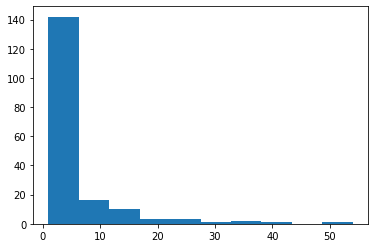

In [51]:
plt.hist(toronto_other.groupby(['Venue Category']).count()['Neighborhood'])
plt.show

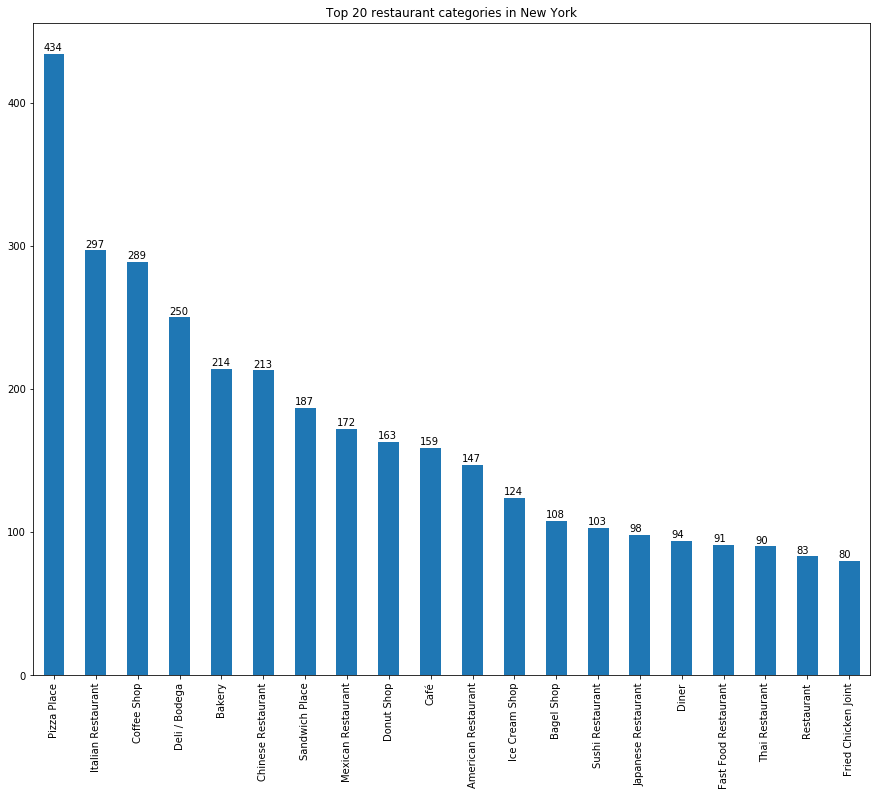

In [52]:
ax=newyork_restaurants['Venue Category'].value_counts().head(20).plot(kind='bar', figsize=(15,12))
plt.title('Top 20 restaurant categories in New York')
[ax.text(i-.25, v+2, '{:.0f}'.format(v)) for i, v in enumerate(newyork_restaurants['Venue Category'].value_counts().head(20))];


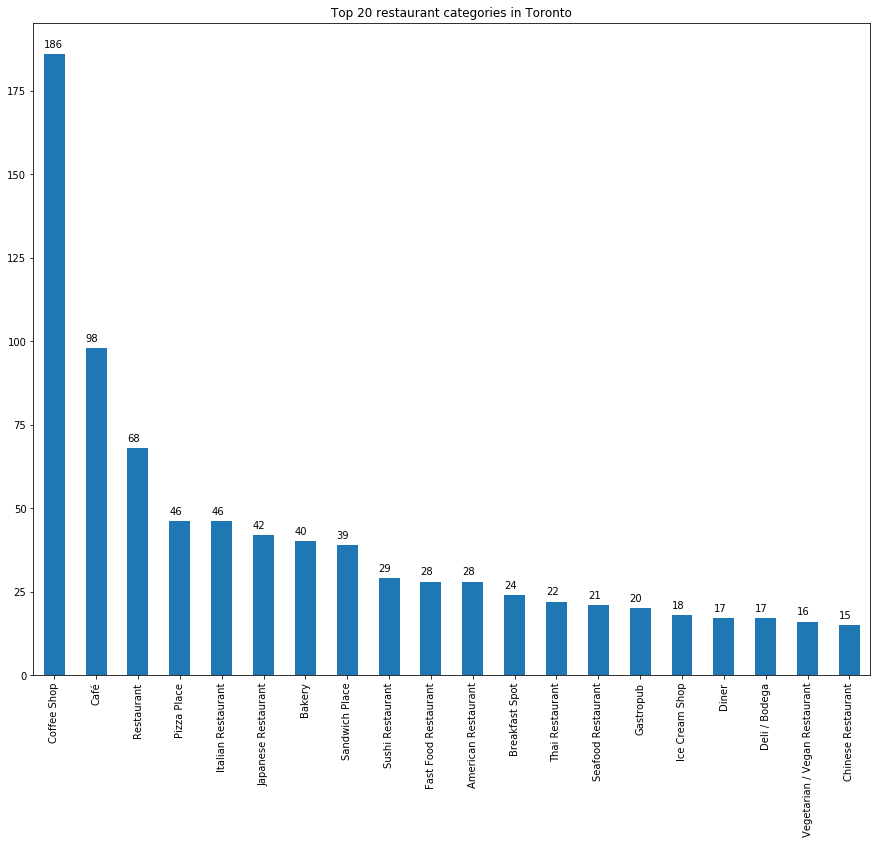

In [53]:
ax=toronto_restaurants['Venue Category'].value_counts().head(20).plot(kind='bar', figsize=(15,12))
plt.title('Top 20 restaurant categories in Toronto')
[ax.text(i-.25, v+2, '{:.0f}'.format(v)) for i, v in enumerate(toronto_restaurants['Venue Category'].value_counts().head(20))];

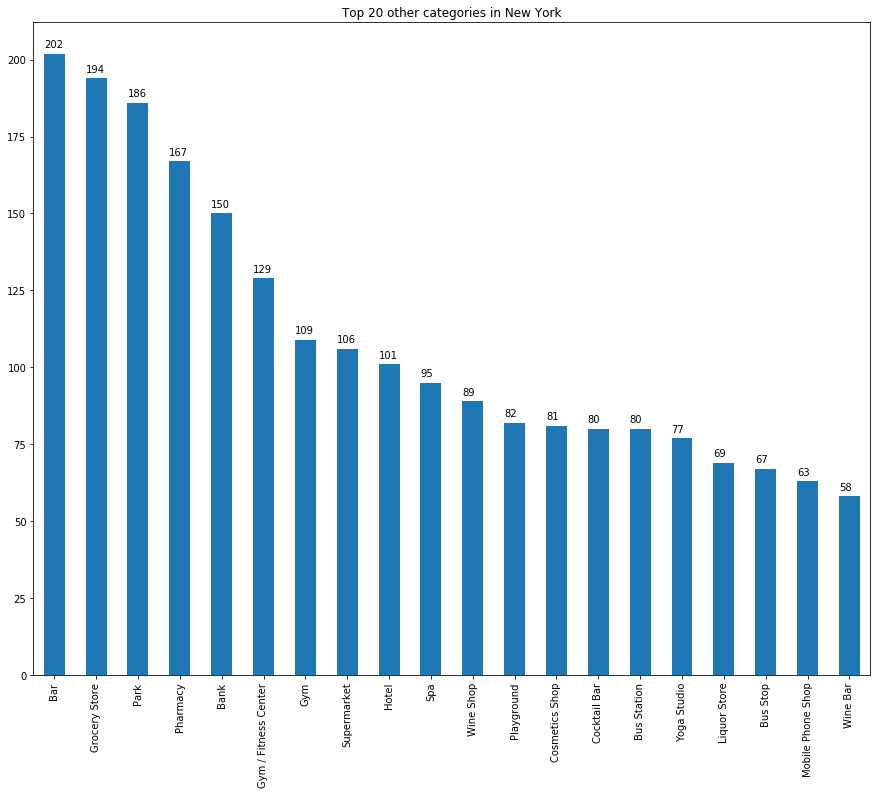

In [54]:
ax=newyork_other['Venue Category'].value_counts().head(20).plot(kind='bar', figsize=(15,12))
plt.title('Top 20 other categories in New York')
[ax.text(i-.25, v+2, '{:.0f}'.format(v)) for i, v in enumerate(newyork_other['Venue Category'].value_counts().head(20))];

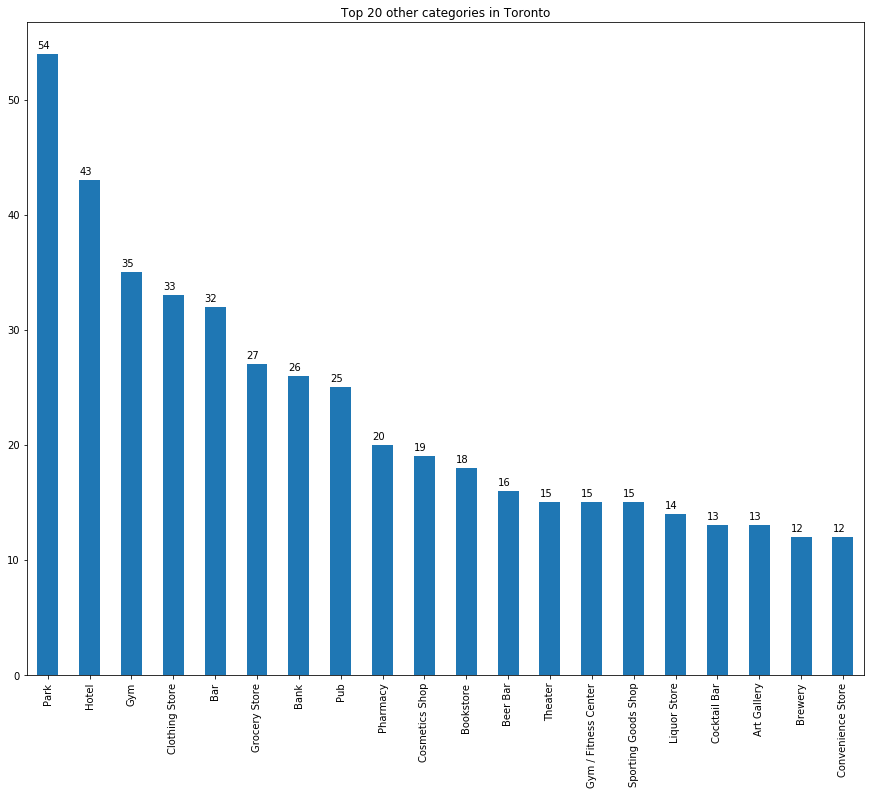

In [55]:
ax=toronto_other['Venue Category'].value_counts().head(20).plot(kind='bar', figsize=(15,12))
plt.title('Top 20 other categories in Toronto')
[ax.text(i-.25, v+.5, '{:.0f}'.format(v)) for i, v in enumerate(toronto_other['Venue Category'].value_counts().head(20))];

In [56]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 0, 
                   newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]].head(10)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Wakefield,Pharmacy,Pizza Place,Gas Station,Sandwich Place,Dessert Shop,Donut Shop,Laundromat,Ice Cream Shop,Falafel Restaurant,Exhibit
1,Co-op City,Bus Station,Park,Grocery Store,Bagel Shop,Pizza Place,Discount Store,Restaurant,Pharmacy,Fried Chicken Joint,Ice Cream Shop
2,Eastchester,Caribbean Restaurant,Deli / Bodega,Diner,Bus Station,Donut Shop,Fast Food Restaurant,Chinese Restaurant,Metro Station,Bowling Alley,Seafood Restaurant
5,Kingsbridge,Pizza Place,Bar,Bakery,Sandwich Place,Mexican Restaurant,Supermarket,Latin American Restaurant,Pub,Pharmacy,Donut Shop
7,Woodlawn,Pub,Deli / Bodega,Pizza Place,Playground,Grocery Store,Bar,Donut Shop,Trail,Train Station,Park
8,Norwood,Pizza Place,Pharmacy,Park,Chinese Restaurant,Deli / Bodega,Bank,Supermarket,Mexican Restaurant,Sandwich Place,Restaurant
10,Baychester,Donut Shop,Electronics Store,Supermarket,Mattress Store,Shopping Mall,Bank,Men's Store,Mexican Restaurant,Sandwich Place,Pet Store
11,Pelham Parkway,Italian Restaurant,Bus Station,Chinese Restaurant,Pizza Place,Eye Doctor,Frozen Yogurt Shop,Sandwich Place,Performing Arts Venue,Track,Donut Shop
13,Bedford Park,Diner,Mexican Restaurant,Chinese Restaurant,Spanish Restaurant,Sandwich Place,Deli / Bodega,Pizza Place,Bus Station,Supermarket,Grocery Store
14,University Heights,Pizza Place,Burger Joint,Pharmacy,Donut Shop,Sandwich Place,Latin American Restaurant,Bakery,History Museum,Fast Food Restaurant,Bank


In [57]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 1, 
                   toronto_merged.columns[[2] + list(range(6, toronto_merged.shape[1]))]].head(10)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,Milliken / Agincourt North / Steeles East / L'...,Park,Playground,Women's Store,Diner,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Distribution Center
23,York Mills West,Park,Bank,Convenience Store,Women's Store,Discount Store,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Distribution Center
25,Parkwoods,Park,Food & Drink Shop,Women's Store,Diner,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Discount Store
40,East Toronto,Park,Convenience Store,Women's Store,Discount Store,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Distribution Center
44,Lawrence Park,Bus Line,Park,Swim School,Women's Store,Dim Sum Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Discount Store
50,Rosedale,Park,Trail,Playground,Discount Store,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner
64,Forest Hill North & West,Jewelry Store,Park,Sushi Restaurant,Trail,Drugstore,Donut Shop,Doner Restaurant,Dog Run,Distribution Center,Eastern European Restaurant
73,Humewood-Cedarvale,Park,Trail,Hockey Arena,Field,Diner,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant
74,Caledonia-Fairbanks,Park,Women's Store,Pool,Diner,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Discount Store
79,North Park / Maple Leaf Park / Upwood Park,Construction & Landscaping,Park,Bakery,Women's Store,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center


In [58]:
for i in np.arange(nykclusters):
    
    print('NY Cluster', i+1, newyork_merged.loc[newyork_merged['Cluster Labels'] == i, 
                   newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]].shape[0])

print('')    
    
for i in np.arange(tokclusters):

    print('TO cluster', i+1, toronto_merged.loc[toronto_merged['Cluster Labels'] == i, 
                   toronto_merged.columns[[1] + list(range(5, toronto_merged.shape[1]))]].shape[0])

NY Cluster 1 117
NY Cluster 2 6
NY Cluster 3 4
NY Cluster 4 10
NY Cluster 5 167

TO cluster 1 82
TO cluster 2 12
TO cluster 3 2
TO cluster 4 1
TO cluster 5 1


In [59]:
newyork_merged.head()

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,0,Pharmacy,Pizza Place,Gas Station,Sandwich Place,Dessert Shop,Donut Shop,Laundromat,Ice Cream Shop,Falafel Restaurant,Exhibit
1,Bronx,Co-op City,40.874294,-73.829939,0,Bus Station,Park,Grocery Store,Bagel Shop,Pizza Place,Discount Store,Restaurant,Pharmacy,Fried Chicken Joint,Ice Cream Shop
2,Bronx,Eastchester,40.887556,-73.827806,0,Caribbean Restaurant,Deli / Bodega,Diner,Bus Station,Donut Shop,Fast Food Restaurant,Chinese Restaurant,Metro Station,Bowling Alley,Seafood Restaurant
3,Bronx,Fieldston,40.895437,-73.905643,4,Music Venue,River,Bus Station,Plaza,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space
4,Bronx,Riverdale,40.890834,-73.912585,4,Park,Bus Station,Bank,Food Truck,Gym,Locksmith,Plaza,Home Service,Falafel Restaurant,Entertainment Service


In [60]:


#newyork_merged.shape #304
#newyork_neighborhoods.shape #306

#toronto_merged.shape #98
#toronto_neighborhoods.shape #103

In [61]:
newyork_merged[newyork_merged['Neighborhood'].isin(ny_rest_filter.index.tolist())]

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,0,Pharmacy,Pizza Place,Gas Station,Sandwich Place,Dessert Shop,Donut Shop,Laundromat,Ice Cream Shop,Falafel Restaurant,Exhibit
1,Bronx,Co-op City,40.874294,-73.829939,0,Bus Station,Park,Grocery Store,Bagel Shop,Pizza Place,Discount Store,Restaurant,Pharmacy,Fried Chicken Joint,Ice Cream Shop
2,Bronx,Eastchester,40.887556,-73.827806,0,Caribbean Restaurant,Deli / Bodega,Diner,Bus Station,Donut Shop,Fast Food Restaurant,Chinese Restaurant,Metro Station,Bowling Alley,Seafood Restaurant
5,Bronx,Kingsbridge,40.881687,-73.902818,0,Pizza Place,Bar,Bakery,Sandwich Place,Mexican Restaurant,Supermarket,Latin American Restaurant,Pub,Pharmacy,Donut Shop
6,Manhattan,Marble Hill,40.876551,-73.910660,4,Sandwich Place,Coffee Shop,Gym,Yoga Studio,Video Game Store,Donut Shop,Supplement Shop,Bank,Pharmacy,Kids Store
7,Bronx,Woodlawn,40.898273,-73.867315,0,Pub,Deli / Bodega,Pizza Place,Playground,Grocery Store,Bar,Donut Shop,Trail,Train Station,Park
8,Bronx,Norwood,40.877224,-73.879391,0,Pizza Place,Pharmacy,Park,Chinese Restaurant,Deli / Bodega,Bank,Supermarket,Mexican Restaurant,Sandwich Place,Restaurant
10,Bronx,Baychester,40.866858,-73.835798,0,Donut Shop,Electronics Store,Supermarket,Mattress Store,Shopping Mall,Bank,Men's Store,Mexican Restaurant,Sandwich Place,Pet Store
11,Bronx,Pelham Parkway,40.857413,-73.854756,0,Italian Restaurant,Bus Station,Chinese Restaurant,Pizza Place,Eye Doctor,Frozen Yogurt Shop,Sandwich Place,Performing Arts Venue,Track,Donut Shop
12,Bronx,City Island,40.847247,-73.786488,4,Harbor / Marina,Seafood Restaurant,Park,Thrift / Vintage Store,Music Venue,Diner,Grocery Store,Liquor Store,Baseball Field,Bar


In [62]:
toronto_merged[toronto_merged['Neighborhood'].isin(to_rest_filter.index.tolist())]

,Postcode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,M1T,Scarborough,Clarks Corners / Tam O'Shanter / Sullivan,43.781638,-79.304302,0,Pharmacy,Pizza Place,Coffee Shop,Thai Restaurant,Chinese Restaurant,Italian Restaurant,Fast Food Restaurant,Bank,Fried Chicken Joint,Noodle House
15,M1W,Scarborough,Steeles West / L'Amoreaux West,43.799525,-79.318389,0,Fast Food Restaurant,Chinese Restaurant,Coffee Shop,Bank,Indian Restaurant,Cosmetics Shop,Pizza Place,Pharmacy,Supermarket,Bubble Tea Shop
22,M2N,North York,Willowdale,43.770120,-79.408493,0,Pizza Place,Coffee Shop,Ramen Restaurant,Grocery Store,Restaurant,Sandwich Place,Sushi Restaurant,Café,Fast Food Restaurant,Lounge
24,M2R,North York,Willowdale,43.782736,-79.442259,0,Pizza Place,Coffee Shop,Ramen Restaurant,Grocery Store,Restaurant,Sandwich Place,Sushi Restaurant,Café,Fast Food Restaurant,Lounge
26,M3B,North York,Don Mills,43.745906,-79.352188,0,Coffee Shop,Restaurant,Asian Restaurant,Beer Store,Japanese Restaurant,Gym,Sporting Goods Shop,Italian Restaurant,Sandwich Place,Discount Store
27,M3C,North York,Don Mills,43.725900,-79.340923,0,Coffee Shop,Restaurant,Asian Restaurant,Beer Store,Japanese Restaurant,Gym,Sporting Goods Shop,Italian Restaurant,Sandwich Place,Discount Store
28,M3H,North York,Bathurst Manor / Wilson Heights / Downsview North,43.754328,-79.442259,0,Coffee Shop,Bank,Shopping Mall,Park,Diner,Bridal Shop,Restaurant,Deli / Bodega,Ice Cream Shop,Supermarket
34,M4A,North York,Victoria Village,43.725882,-79.315572,0,Coffee Shop,French Restaurant,Hockey Arena,Pizza Place,Portuguese Restaurant,Women's Store,Dessert Shop,Dance Studio,Deli / Bodega,Department Store
35,M4B,East York,Parkview Hill / Woodbine Gardens,43.706397,-79.309937,0,Pizza Place,Bank,Gastropub,Gym / Fitness Center,Athletics & Sports,Fast Food Restaurant,Pharmacy,Intersection,Diner,Deli / Bodega
39,M4H,East York,Thorncliffe Park,43.705369,-79.349372,0,Indian Restaurant,Yoga Studio,Restaurant,Supermarket,Sandwich Place,Fast Food Restaurant,Pizza Place,Pharmacy,Bus Line,Park
